<br/><div id="top"></div>
<center><a style="font-size: 40pt; font-weight:bold"> Signal Processing TP6</a></center>
<br/>

---

# Group members
* Jauroyon, Maxime
* Bhatt, Ragi

---

## Data

    Images you want (you can use Barbara provided in the Fourier section)

## To do

    Simulate various inpainting problem as follow
        Generate a random binary matrix A of the same size of the image, with a parameter p controling the bernoulli law
        Add some white gaussian noise (at various level)
        Generate the direct problem y=Ax+b (where x is the original image)
    Estimate x using the sparse approach (reminder: an image is sparse in the wavelet domain)
    Discuss the results obtained by changing:
        the sparse respresentation (various wavelet orhtogonal transform and translation invariant wavelets)
        the thresholding rules (soft, hard, empirical Wiener)
        the choice of the λ parameter
        Discussion whould be made with respect to the value of p and the level of noise


---

<a style="font-size: 30pt; font-weight:bold"> 1. Simulate inpainting problem </a>

## Taking what we did in the TP5 but adding the masking matrix A

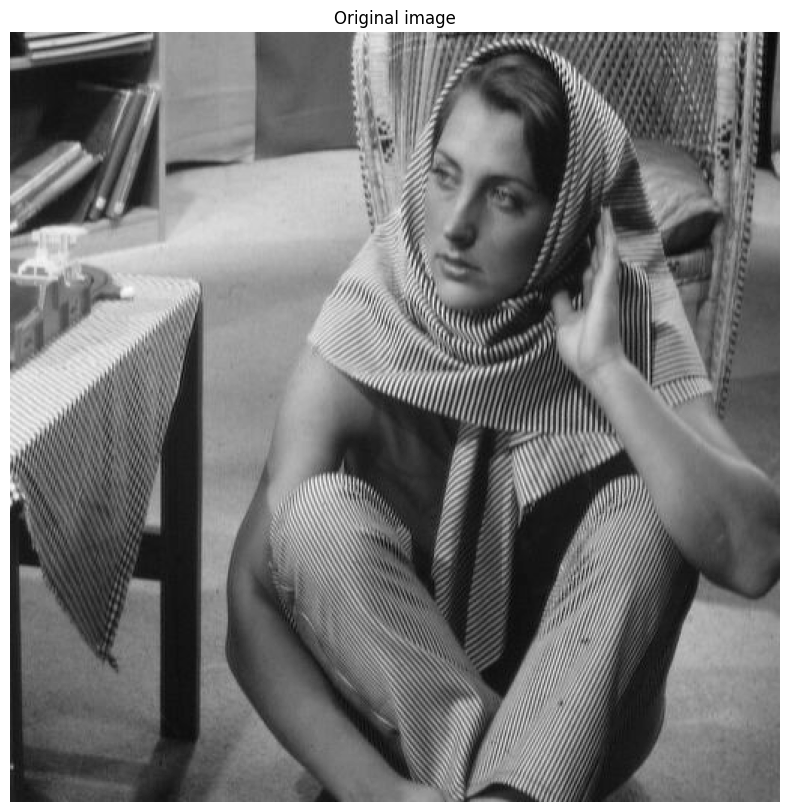

n =  512
N =  262144


In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from numpy import random
import numpy as np
from scipy import misc
from scipy import ndimage
from scipy import signal
from scipy.fft import fft, fftfreq, fft2, ifft2, fftshift, ifft, ifftshift
from scipy import stats
import scipy as sp

# Load image
img = mpimg.imread('barbara.jpg')
img = img[:,:,0]

# Plot image
plt.figure(figsize=(10,10))
plt.imshow(img, cmap='gray')
plt.title('Original image')
plt.axis('off')
plt.show()

n = img.shape[0]
N = n**2
print('n = ', n)
print('N = ', N)

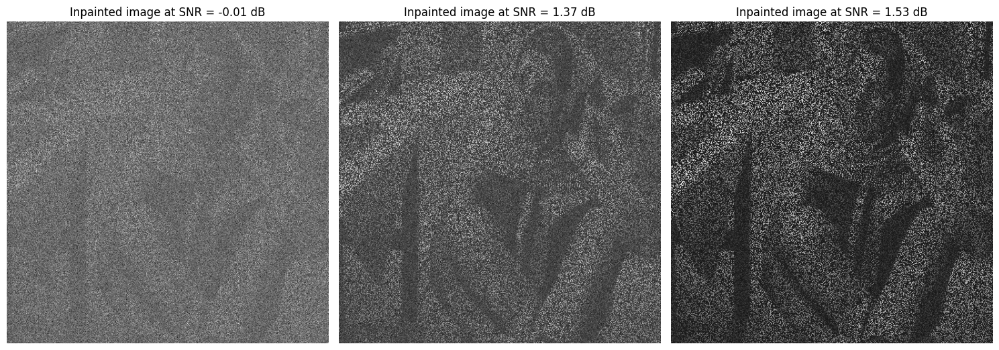

In [2]:
# Simulate various inpainting problem as follow

def inpainting(img, SNR, p):
    # Generate a random binary matrix A of the same size of the image, with a parameter p controling the bernoulli law
    # Add some white gaussian noise (at various level)
    # Generate the direct problem y=Ax+b (where x is the original image)
    n = img.shape[0]

    rho = 1 - p

    Omega = np.zeros([n, n])
    sel = random.permutation(n**2)
    np.ravel(Omega)[sel[np.arange(int(rho*n**2))]] = 1

    
    Phi = lambda f, Omega: f*(1-Omega)

    y = Phi(img, Omega)

    # Compute the variance of the noise
    sigma = np.sqrt(np.linalg.norm(y)**2/(N*10**(SNR/10)))

    # Gaussian white noise
    noise = sigma * np.random.randn(n,n)

    # noisy image
    y = y + noise 

    # Compute the SNR
    SNR = 20*np.log10(np.linalg.norm(img)/np.linalg.norm(img-y))

    return y, SNR, sigma, noise, Omega

# compute and plot all the images with different SNR (0dB, 10 dB, 20 dB) on a same plot so we can compare easily

SNR = [0, 10, 20]
ys = []
y_snrs = []
y_noises = []
y_omegas = []
plt.figure(figsize=(15,8))
for i in range(3):
    y, snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    ys.append(y)
    y_snrs.append(snr)
    y_noises.append(noiseT)
    y_omegas.append(omega)

    # plot the inpainted image above
    plt.subplot(1, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

---

<a style="font-size: 30pt; font-weight:bold"> 2. Estimate x using sparse approach </a>

## Following the numerical tour on Inpainting using Sparse Regularization

In [3]:
# import the general.py file and signal.py file to use the fct inside them 
from toolbox.general_tool import *
from toolbox.signal_tool import *

## First we load the image to be inpainted.

In [4]:
n = 128
f0 = load_image("lena.bmp")
f0 = rescale(f0[256-n//2:256+n//2,256-n//2:256+n//2])

## Display it.

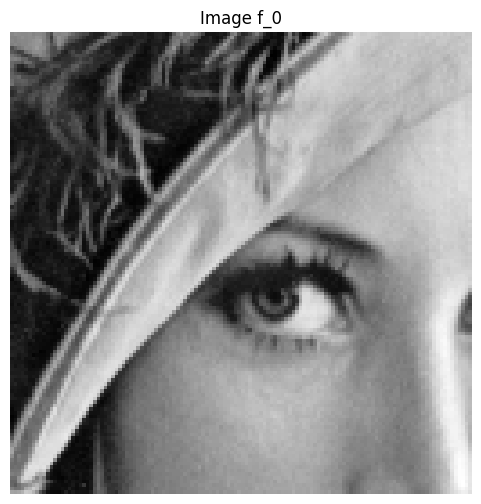

In [5]:
plt.figure(figsize = (6,6))
imageplot(f0, 'Image f_0')

In [6]:
rho = .7

In [7]:


from numpy import random

Omega = np.zeros([n, n])
sel = random.permutation(n**2)
np.ravel(Omega)[sel[np.arange(int(rho*n**2))]] = 1



In [8]:


Phi = lambda f, Omega: f*(1-Omega)



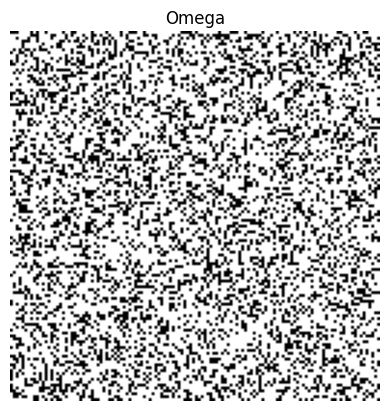

In [9]:
imageplot(Omega, 'Omega')

In [10]:
y = Phi(f0, Omega)

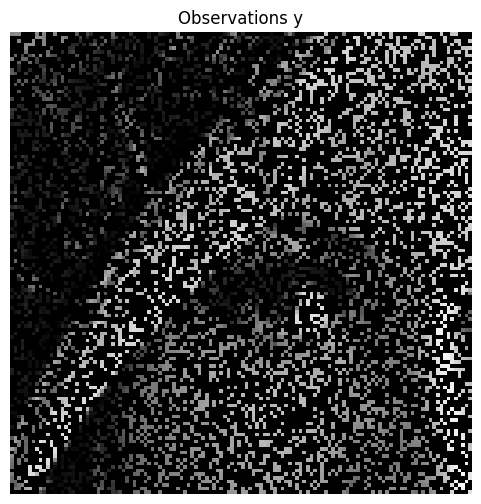

In [11]:
plt.figure(figsize = (6,6))
imageplot(y, 'Observations y')

## <a> Soft Thresholding in a Basis </a>

In [12]:
SoftThresh = lambda x, T: x*np.maximum(1-T/np.maximum(abs(x), 1e-10*np.ones(np.shape(x))), np.zeros(np.shape(x)))

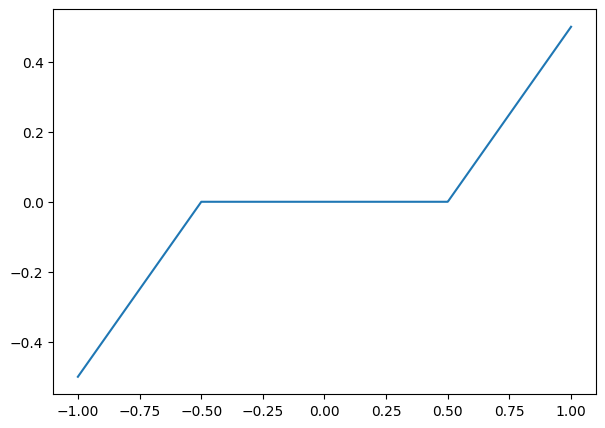

In [13]:
x = np.linspace(-1, 1, 1000)

plt.figure(figsize=(7,5))
plt.plot(x, SoftThresh(x,.5))
plt.show()

In [14]:
Jmax = np.log2(n)-1
Jmin = (Jmax-3)

In [15]:
from toolbox.perform_wavelet_transf import *

Psi = lambda a: perform_wavelet_transf(a, Jmin, -1, ti=0)
PsiS = lambda f: perform_wavelet_transf(f, Jmin, +1, ti=0)

In [16]:
SoftThreshPsi = lambda f, T: Psi(SoftThresh(PsiS(f), T))

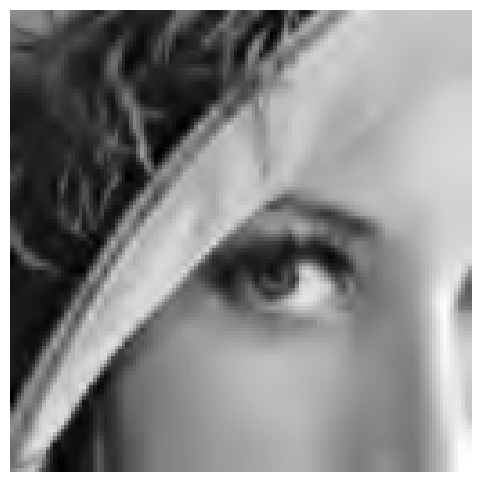

In [17]:
plt.figure(figsize=(6,6))
imageplot(clamp(SoftThreshPsi(f0, 0.1)))

## <a> Inpainting using Orthogonal Wavelet Sparsity </a>

In [18]:
lambd = .03

In [19]:
ProjC = lambda f, Omega: Omega*f + (1-Omega)*y

In [20]:
fSpars = y

In [21]:
fSpars = ProjC(fSpars, Omega)

In [22]:
fSpars = SoftThreshPsi(fSpars, lambd)

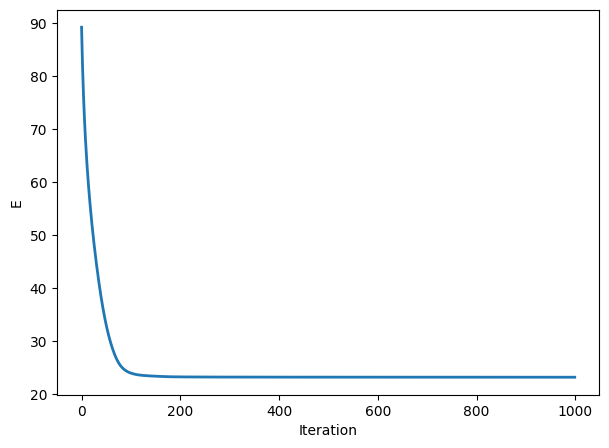

In [23]:
fSpars = y
energy = []
niter = 1000
for i in range(niter):
    fSpars = SoftThreshPsi(ProjC(fSpars, Omega), lambd)
    # record the energy
    fW = PsiS(fSpars)
    energy = energy + [1/2*np.linalg.norm(y-Phi(fSpars, Omega),"fro")**2 + lambd*np.sum(abs(fW))]
    
plt.figure(figsize=(7,5))
plt.plot(energy, linewidth=2)
plt.xlabel("Iteration")
plt.ylabel("E")
plt.show()

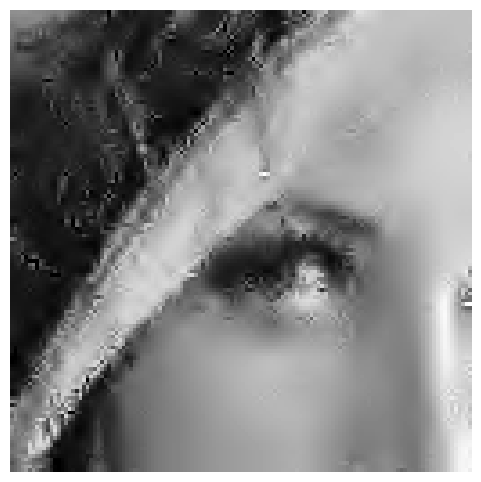

In [24]:
plt.figure(figsize=(6,6))
imageplot(clamp(fSpars))

## Since there is no noise, one should in theory take λ→0. To do this, decay the value of λ through the iterations.

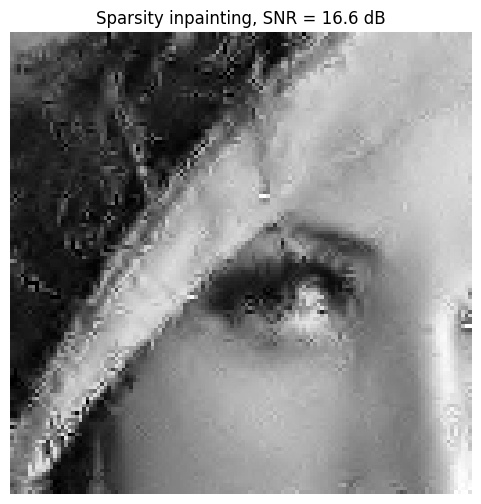

In [25]:
fSpars = y
niter = 1000
lambda_list = np.linspace(.03, 0, niter)
err = []

for i in range(niter):
    fSpars = SoftThreshPsi(ProjC(fSpars, Omega), lambda_list[i])
    
plt.figure(figsize=(6,6))
imageplot(clamp(fSpars), "Sparsity inpainting, SNR = %.1f dB" %snr(f0, fSpars))

## <a> Inpainting using Translation Invariant Wavelet Sparsity </a>

In [26]:
J = Jmax-Jmin + 1
u = np.hstack(([4**(-J)], 4**(-np.floor(np.arange(J + 2./3,1,-1./3)))))
U = np.transpose(np.tile(u, (n,n,1)),(2,0,1))

In [27]:
lambd = .01

In [28]:
Xi = lambda a: perform_wavelet_transf(a, Jmin, -1, ti=1)
PsiS = lambda f: perform_wavelet_transf(f, Jmin, + 1, ti=1)
Psi = lambda a: Xi(a/U)

In [29]:
tau = 1.9*np.min(u)

In [30]:
a = U*PsiS(fSpars)

In [31]:
fTI = Psi(a)
a = a + tau*PsiS(Phi(y-Phi(fTI, Omega), Omega))

In [32]:
a = SoftThresh(a, lambd*tau)

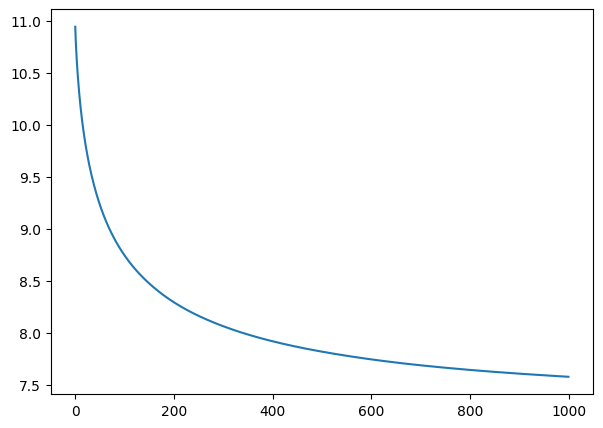

In [33]:
niter = 1000
a = U*PsiS(fSpars)
E = []
for i in range(niter):
    fTI = Psi(a)
    d = y-Phi(fTI, Omega)
    E = E + [1/2*np.linalg.norm(d , 'fro')**2 + lambd*np.sum(abs(a))]
    # step 
    a = SoftThresh(a + tau*PsiS(Phi(d, Omega)), lambd*tau)

plt.figure(figsize=(7,5))    
plt.plot(E)
plt.show()

In [34]:


fTI = Psi(a)



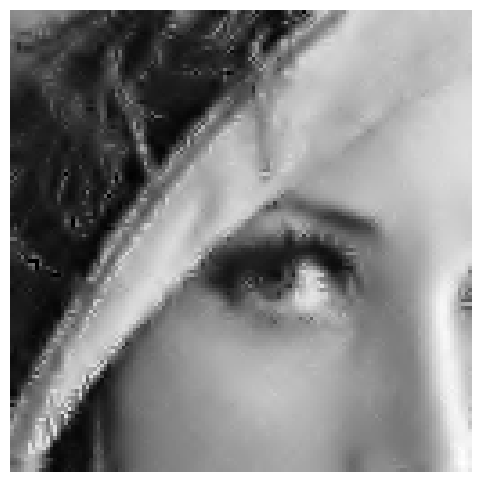

In [35]:


plt.figure(figsize=(6,6))
imageplot(clamp(fTI))



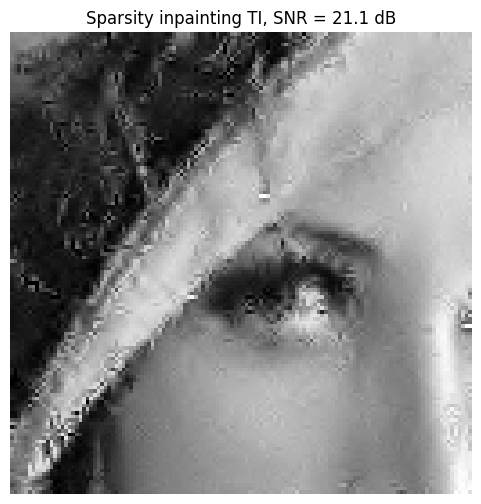

In [36]:
niter = 3000
lambda_list = np.linspace(.03, 0, niter)
err = []

for i in range(niter):
    fTI = Psi(a)
    d = y-Phi(fTI, Omega)
    #step
    a = SoftThresh(a + tau*PsiS(Phi(d, Omega)) , lambda_list[i]*tau) 
    
plt.figure(figsize=(6,6))
imageplot(clamp(fSpars), "Sparsity inpainting TI, SNR = %.1f dB" %snr(f0, fTI))

## <a> Inpainting using Iterative Hard Thresholding </a>

In [37]:
HardThresh = lambda x, t: x*(abs(x) > t)

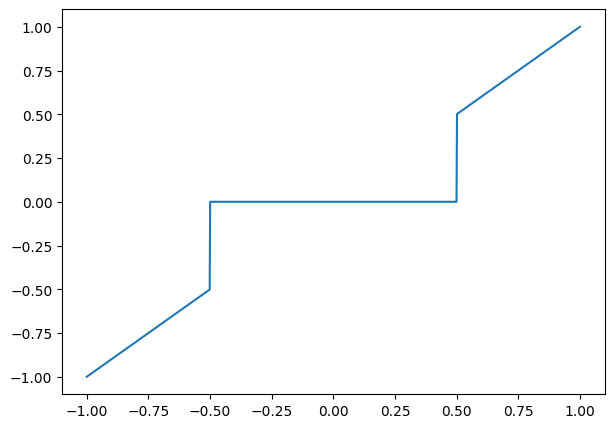

In [38]:


x = np.linspace(-1, 1, 1000)

plt.figure(figsize=(7,5))
plt.plot(x, HardThresh(x, .5))
plt.show()



In [39]:


niter = 500



In [40]:
lambda_list = np.linspace(1, 0, niter)

In [41]:
fHard = y

In [42]:
fHard = ProjC(fHard, Omega)

In [43]:
fHard = Xi(HardThresh(PsiS(fHard), tau*lambda_list[1]))

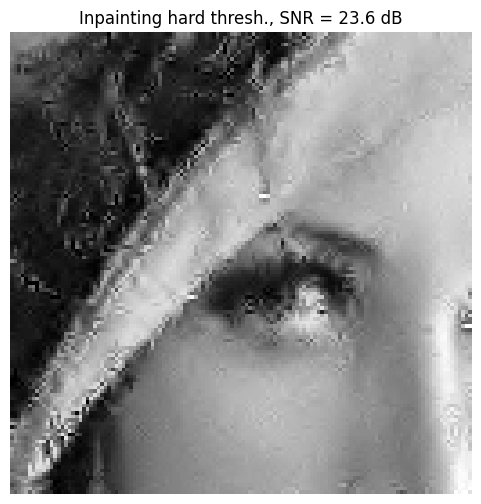

In [44]:
lambda_list = np.linspace(1, 0, niter)
fHard = y

for i in range(niter):
    fHard = Xi(HardThresh(PsiS(ProjC(fHard, Omega)), lambda_list[i]))

    
plt.figure(figsize=(6,6))
imageplot(clamp(fSpars), "Inpainting hard thresh., SNR = %.1f dB" %snr(f0, fHard))

---

## <a> 3. Discuss the results </a>

## putting all the methods in functions to test the different parameters
        the sparse respresentation (various wavelet orhtogonal transform and translation invariant wavelets)
        the thresholding rules (soft, hard, empirical Wiener)
        the choice of the λ parameter
        Discussion would be made with respect to the value of p and the level of noise

In [45]:
def soft_iterative(img, Omega, lambd, niter,decreasing = False, filter = "9-7"):
    lambda_list = np.linspace(lambd, 0, niter)
    n = img.shape[0]

    Psi = lambda a: perform_wavelet_transf(a, Jmin, -1, ti=0, filter = filter)
    PsiS = lambda f: perform_wavelet_transf(f, Jmin, +1, ti=0, filter = filter)

    SoftThreshPsi = lambda f, T: Psi(SoftThresh(PsiS(f), T))

    fSpars = img
    for i in range(niter):
        if decreasing:
            fSpars = SoftThreshPsi(ProjC(fSpars, Omega), lambda_list[i])
        else:
            fSpars = SoftThreshPsi(ProjC(fSpars, Omega), lambd)
    return fSpars

def hard_iterative(img, Omega, lambd, niter,decreasing = False, filter = "9-7"):
    lambda_list = np.linspace(lambd, 0, niter)
    n = img.shape[0]

    Xi = lambda a: perform_wavelet_transf(a, Jmin, -1, ti=1, filter = filter)
    PsiS = lambda f: perform_wavelet_transf(f, Jmin, + 1, ti=1, filter = filter)

    HardThresh = lambda x, t: x*(abs(x) > t)

    fHard = img
    for i in range(niter):
        if decreasing:
            fHard = Xi(HardThresh(PsiS(ProjC(fHard, Omega)), lambda_list[i]))
        else:
            fHard = Xi(HardThresh(PsiS(ProjC(fHard, Omega)), lambd))
    return fHard


def soft_translation_invariant(img, Omega, lambd, niter, decreasing = False, filter = "9-7"):
    lambda_list = np.linspace(lambd, 0, niter)
    n = img.shape[0]

    Jmax = np.log2(n)-1
    Jmin = (Jmax-3)

    J = Jmax-Jmin + 1
    u = np.hstack(([4**(-J)], 4**(-np.floor(np.arange(J + 2./3,1,-1./3)))))
    U = np.transpose(np.tile(u, (n,n,1)),(2,0,1))

    Xi = lambda a: perform_wavelet_transf(a, Jmin, -1, ti=1, filter = filter)
    PsiS = lambda f: perform_wavelet_transf(f, Jmin, + 1, ti=1, filter = filter)
    Psi = lambda a: Xi(a/U)

    tau = 1.9*np.min(u)

    a = U*PsiS(img)
    
    for i in range(niter):
        fTI = Psi(a)
        d = img-Phi(fTI, Omega)
        # step 
        if decreasing:
            a = SoftThresh(a + tau*PsiS(Phi(d, Omega)), lambda_list[i]*tau)
        else:
            a = SoftThresh(a + tau*PsiS(Phi(d, Omega)), lambd*tau)

    return Psi(a)

---

## <a> the choice of the λ parameter, thresholding rules, level of noise, decreasing λ </a>

## Soft iterative

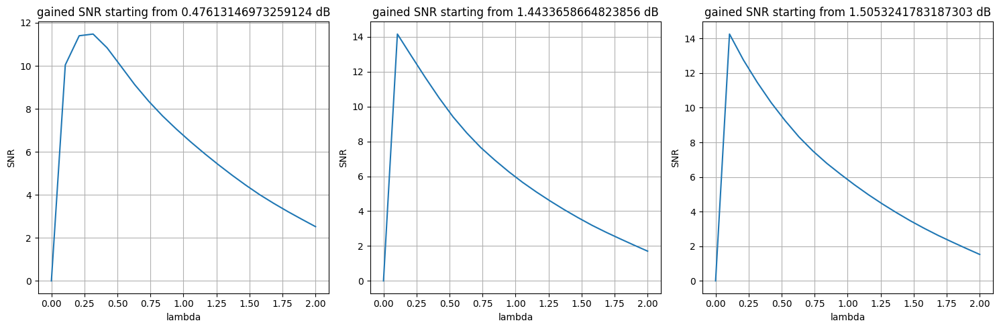

In [46]:
SNR = [-10, 0, 10]
img = f0

best_lambdas_soft = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 20)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_soft = soft_iterative(y, omega, lambdas[j], 1000)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_soft.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Best λ solution in images

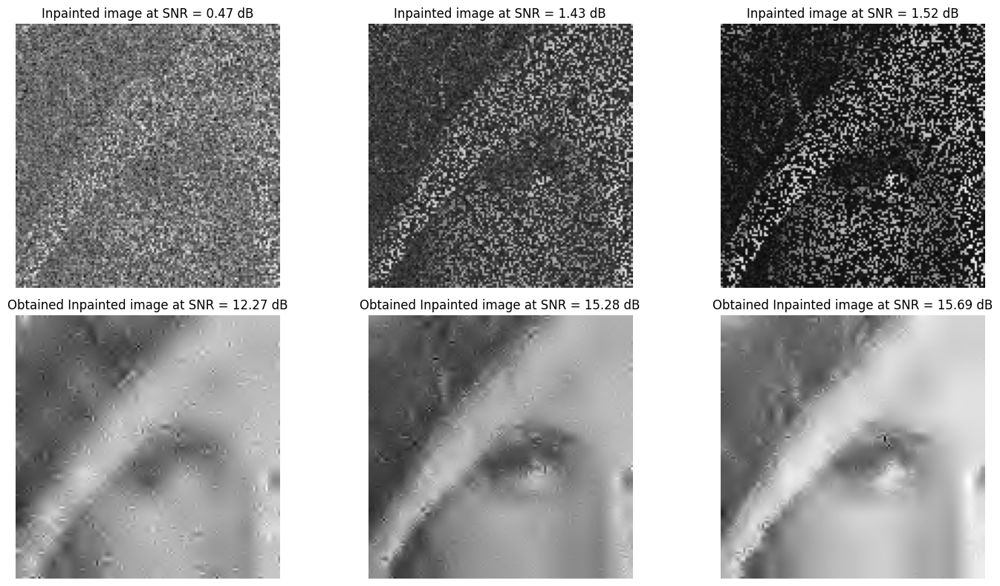

In [47]:
# soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_iterative(y, omega, best_lambda , 1000)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_soft)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft, cmap='gray')
    plt.title('Obtained Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Using decreasing λ

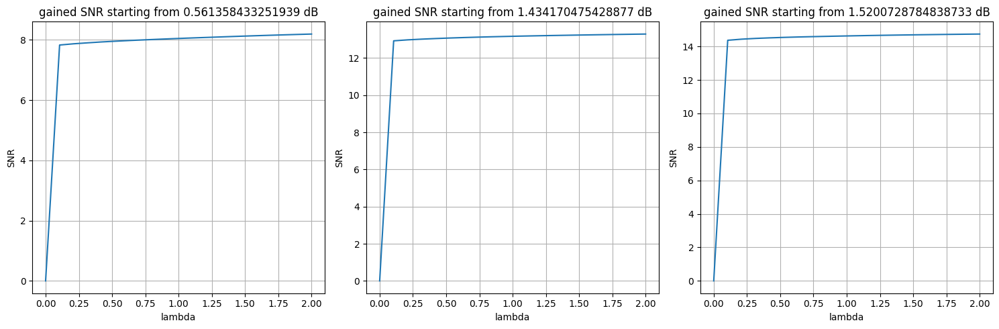

In [48]:
best_lambdas_soft_decrease = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 20)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_soft = soft_iterative(y, omega, lambdas[j], 1000,decreasing=True)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_soft_decrease.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

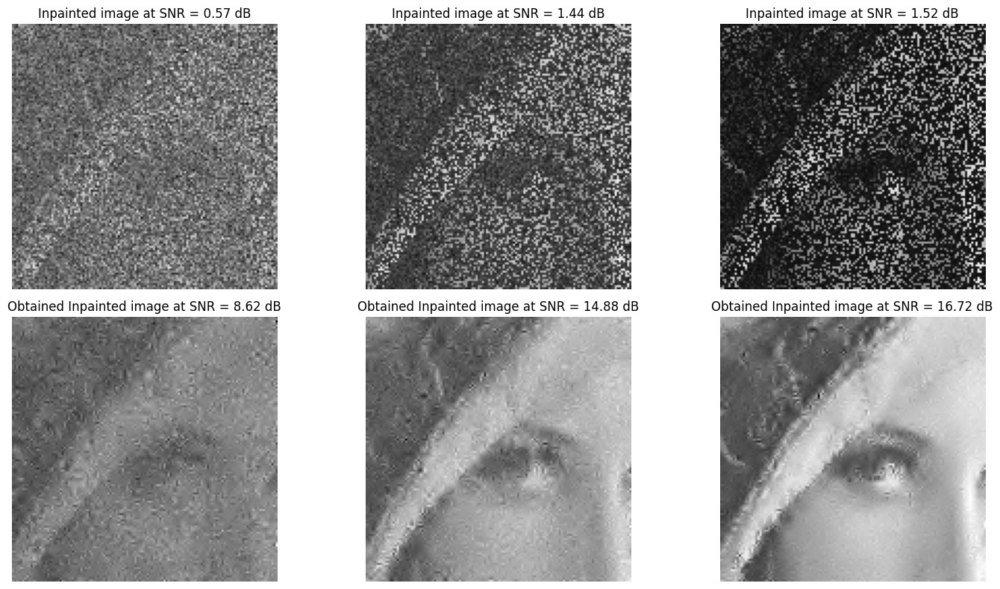

In [49]:
# soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_iterative(y, omega, best_lambda, 1000, decreasing=True)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_soft)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft, cmap='gray')
    plt.title('Obtained Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Hard iterative

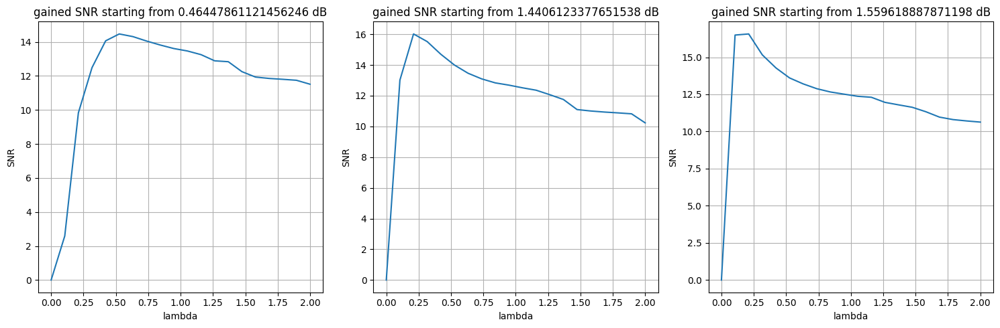

In [50]:
best_lambdas_hard = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 20)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_hard = hard_iterative(y, omega, lambdas[j], 500)
        obtained_snr = snr(img, y_hard)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_hard.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Best λ solution in images

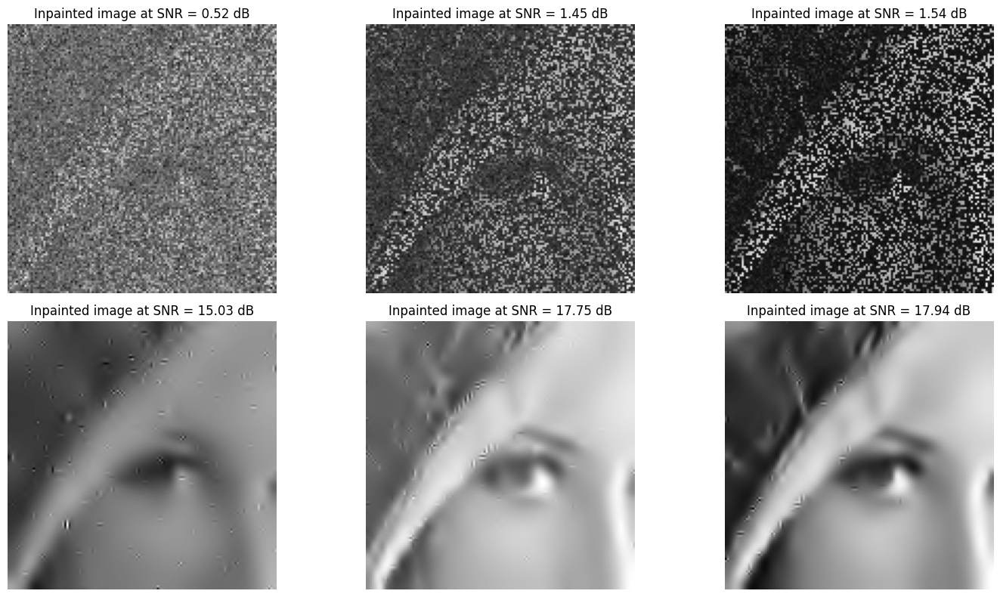

In [51]:
# hard thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_hard[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_hard = hard_iterative(y, omega, best_lambda, 500)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_hard)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_hard, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Using decreasing λ

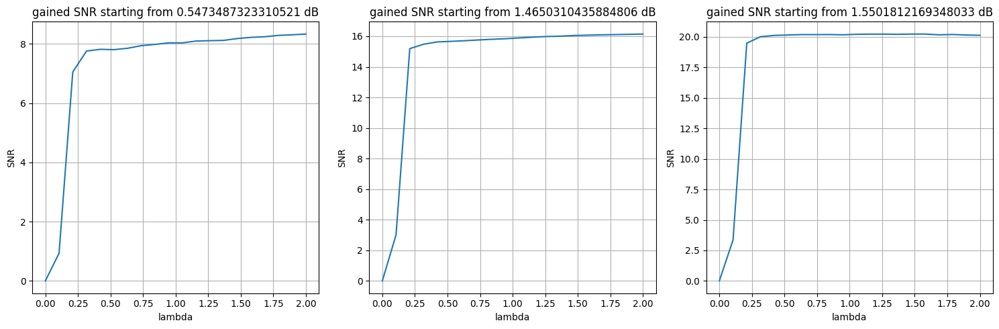

In [52]:
best_lambdas_hard_decrease = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 20)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_hard = hard_iterative(y, omega, lambdas[j], 500, decreasing=True)
        obtained_snr = snr(img, y_hard)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_hard_decrease.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

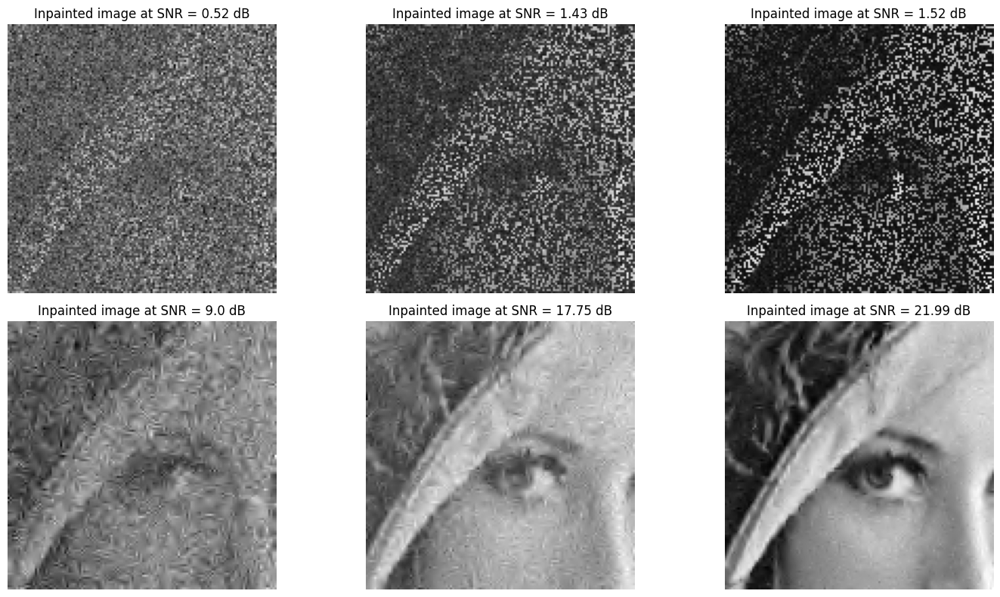

In [53]:
# hard thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_hard_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_hard = hard_iterative(y, omega, best_lambda, 500, decreasing=True)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_hard)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_hard, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Soft translation invariant

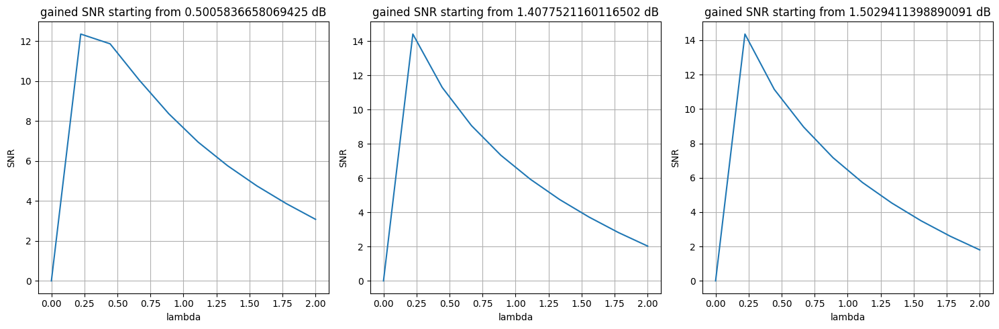

In [54]:
best_lambdas_soft_ti = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 10)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_soft = soft_translation_invariant(y, omega, lambdas[j], 500)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_soft_ti.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Best λ solution in images

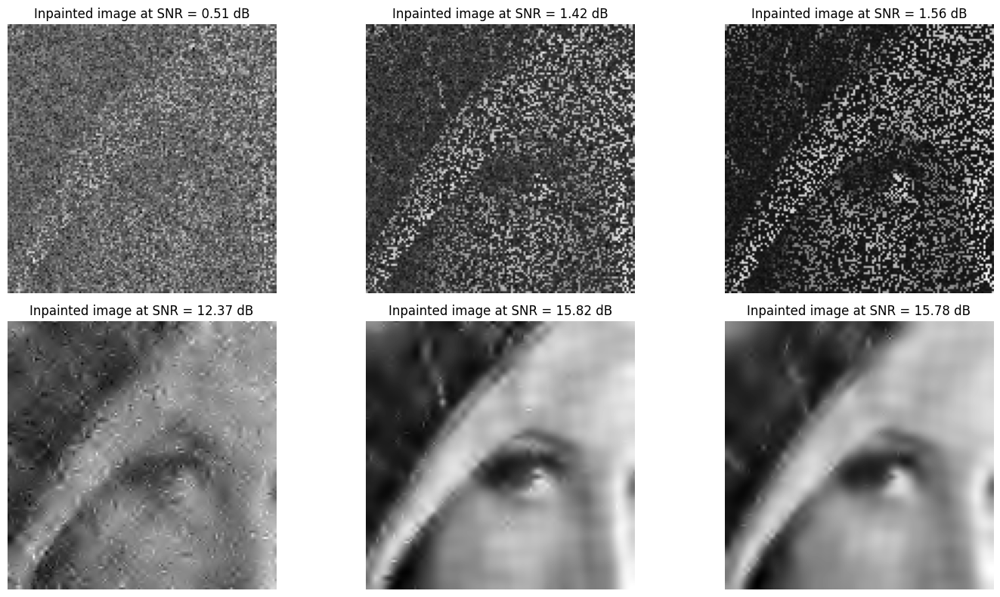

In [55]:
# translation invariant soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft_ti[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_translation_invariant(y, omega, best_lambda, 1000)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_soft)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Using decreasing λ

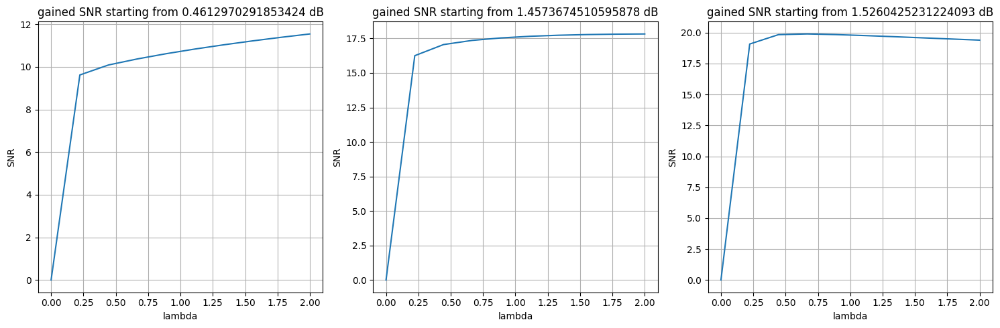

In [56]:
best_lambdas_soft_ti_decrease = []
plt.figure(figsize=(15,5))
for i in range(3):
    lambdas = np.linspace(2, 0, 10)
    err = []
    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    for j in range(len(lambdas)):
        y_soft = soft_translation_invariant(y, omega, lambdas[j], 500, decreasing=True)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_lambdas_soft_ti_decrease.append(lambdas[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(lambdas, err)
    plt.title('gained SNR starting from ' + str(y_snr) + ' dB')
    plt.xlabel('lambda')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

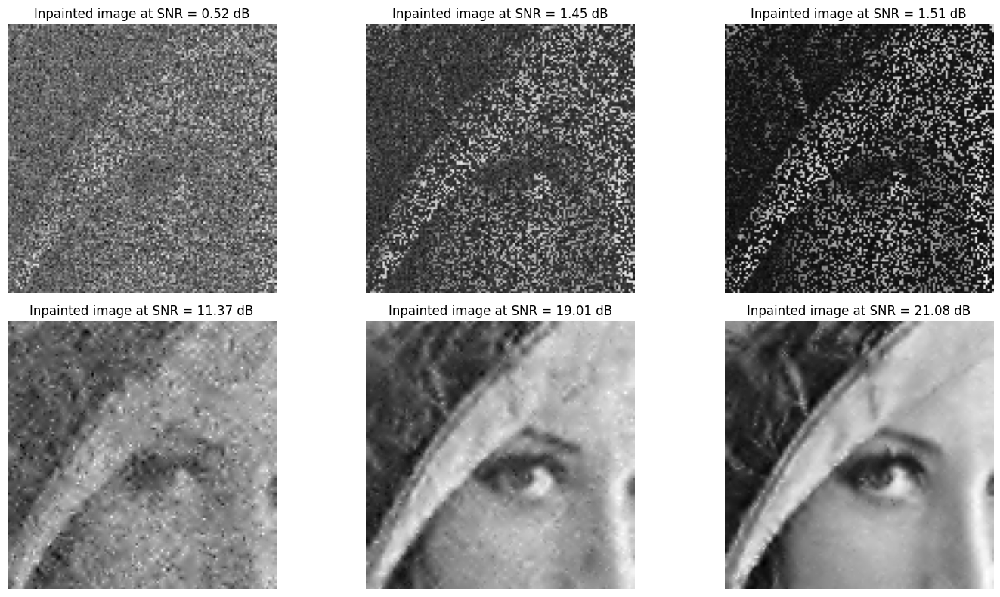

In [57]:
# translation invariant soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft_ti_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_translation_invariant(y, omega, best_lambda, 1000, decreasing=True)
    plt.subplot(2, 3, i+1)
    plt.imshow(y, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(y_snr, 2)) + ' dB')
    plt.axis('off')
    obtained_snr = snr(img, y_soft)
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft, cmap='gray')
    plt.title('Inpainted image at SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Choice of λ : 

    overall it seems that the best λ is between 0.1 and 0.25

## Decreasin λ :

    contrary to constant λ, decreasing λ seems to have a plateau after getting the best λ which means that the choice of λ is not that hard to make

    BUT it's increasing the SNR gain a lot ONLY when there is not a lot of noise, otherwise it's performing way worse than constant λ

## Thresholding rules :
    
    Hard thresholding is performing better than soft thresholding in all cases, even with the huge improvement of soft thresholding with decreasing λ and translation invariant wavelet

## Noise level :
    
    the higher the noise level, the less SNR we gain, but the best λ is still between 0.1 and 0.25

### Observations:

    -When using inpainting using sparse regularization, it is recommended to use a λ between 0.1 and 0.25.
    -If the noise level is low, it may be beneficial to decrease λ to further improve the SNR gain of the inpainted image. However, if the noise level is high, it is recommended to use a constant λ.
    -Hard thresholding should be used as the thresholding rule for inpainting using sparse regularization.
    -It is important to be aware of the impact of the noise level on the performance of inpainting using sparse regularization. If the noise level is high, it may be difficult to achieve a significant SNR gain.

---

## <a> the sparse respresentation </a>

## Now we will test a different wavelet transform, the "linear" that is already implemented in perform_wavelet_transfom function

## Soft iterative (decreasing λ)

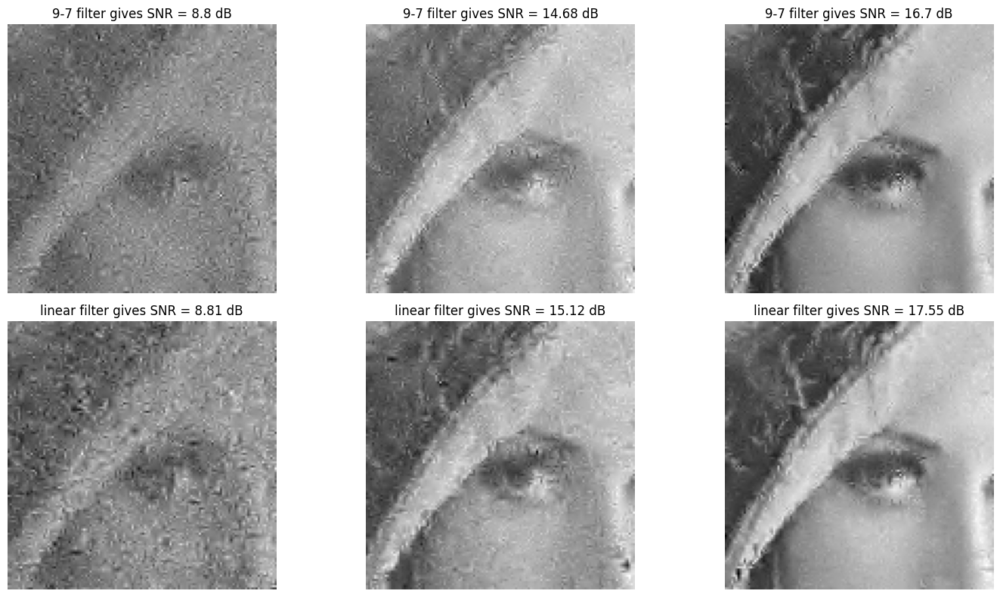

In [58]:
# soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_iterative(y, omega, best_lambda , 1000, decreasing=True)
    obtained_snr = snr(img, y_soft)
    y_soft_linear = soft_iterative(y, omega, best_lambda , 1000, filter="linear", decreasing=True)
    obtained_snr_linear = snr(img, y_soft_linear)

    plt.subplot(2, 3, i+1)
    plt.imshow(y_soft, cmap='gray')
    plt.title('9-7 filter gives SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft_linear, cmap='gray')
    plt.title('linear filter gives SNR = ' + str(round(obtained_snr_linear, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Hard iterative (decreasing λ)

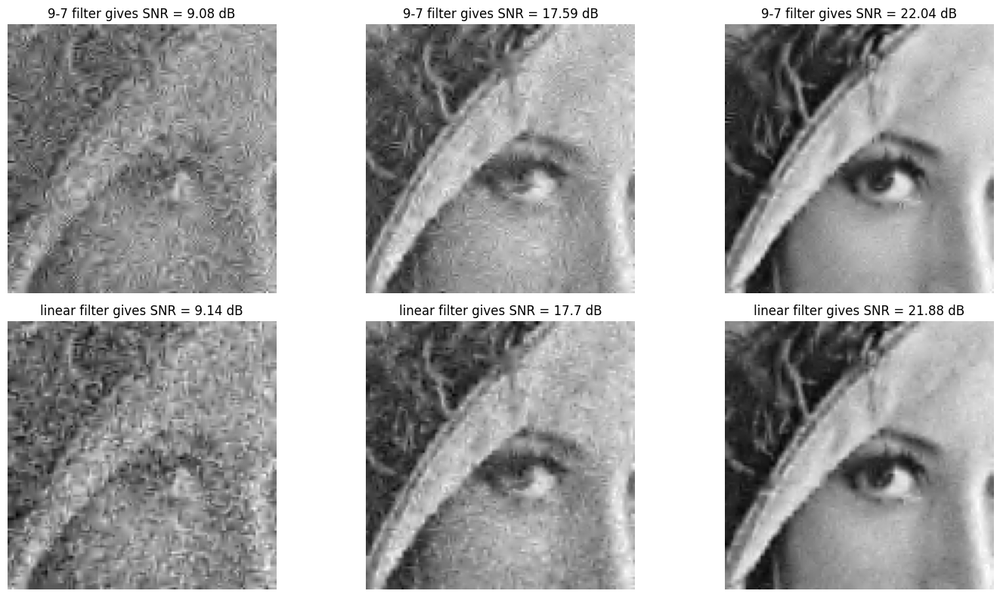

In [59]:
# hard thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_hard_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_hard = hard_iterative(y, omega, best_lambda, 500, decreasing=True)
    obtained_snr = snr(img, y_hard)
    y_hard_linear = hard_iterative(y, omega, best_lambda, 500, filter="linear", decreasing=True)
    obtained_snr_linear = snr(img, y_hard_linear)

    plt.subplot(2, 3, i+1)
    plt.imshow(y_hard, cmap='gray')
    plt.title('9-7 filter gives SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')
    plt.subplot(2, 3, i+4)
    plt.imshow(y_hard_linear, cmap='gray')
    plt.title('linear filter gives SNR = ' + str(round(obtained_snr_linear, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Soft translation invariant (decreasing λ)

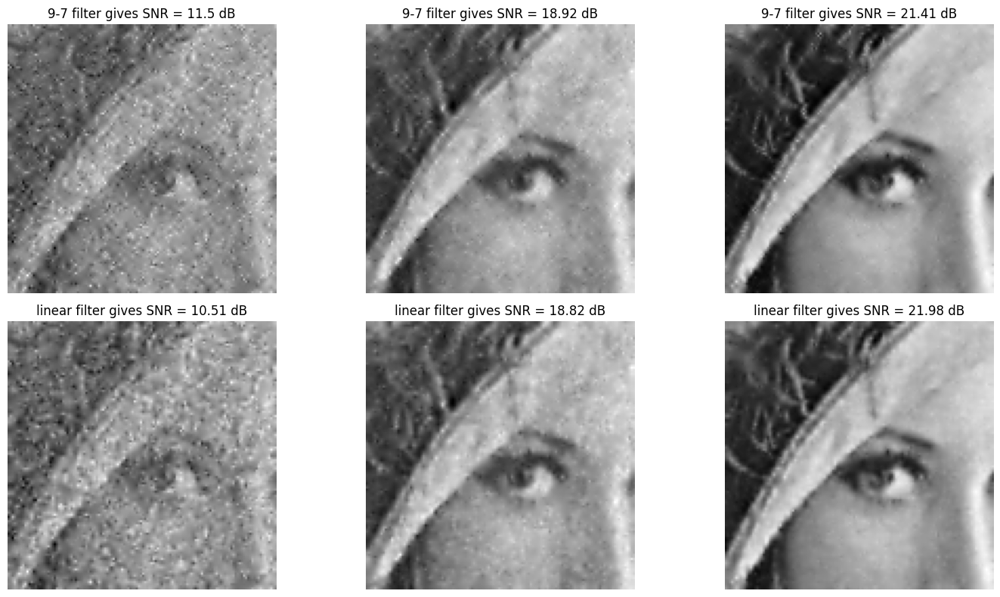

In [60]:
# translation invariant soft thresholding
plt.figure(figsize=(15,8))
for i in range(3):

    # get the best lambda
    best_lambda = best_lambdas_soft_ti_decrease[i]

    y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],0.3)
    y_soft = soft_translation_invariant(y, omega, best_lambda, 1000, decreasing=True)
    obtained_snr = snr(img, y_soft)
    y_soft_linear = soft_translation_invariant(y, omega, best_lambda, 1000, filter="linear", decreasing=True)
    obtained_snr_linear = snr(img, y_soft_linear)
    
    plt.subplot(2, 3, i+1)
    plt.imshow(y_soft, cmap='gray')
    plt.title('9-7 filter gives SNR = ' + str(round(obtained_snr, 2)) + ' dB')
    plt.axis('off')
    plt.subplot(2, 3, i+4)
    plt.imshow(y_soft_linear, cmap='gray')
    plt.title('linear filter gives SNR = ' + str(round(obtained_snr_linear, 2)) + ' dB')
    plt.axis('off')

plt.tight_layout()
plt.show()

## Choice of the wavelet transform :

    the linear wavelet transform is performing better than the 9-7 wavelet transform when there is less noise but the difference is minimal

---

## <a> The value of p </a>

## Soft iterative (decreasing λ)

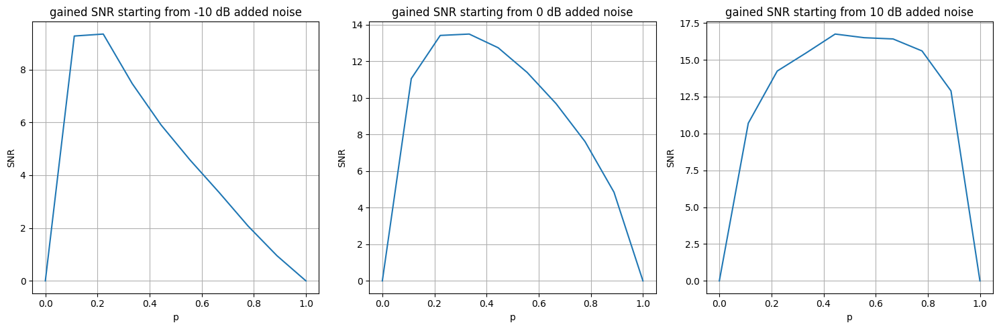

In [61]:
best_p = []
plt.figure(figsize=(15,5))
for i in range(3):
    p = np.linspace(1, 0, 10)
    err = []
    best_lambda = best_lambdas_soft_decrease[i]
    for j in range(len(p)):
        y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],p[j])
        y_soft = soft_iterative(y, omega, best_lambda, 1000,decreasing=True)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_p.append(p[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(p, err)
    plt.title('gained SNR starting from ' + str(SNR[i]) + ' dB added noise')
    plt.xlabel('p')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Hard iterative (decreasing λ)

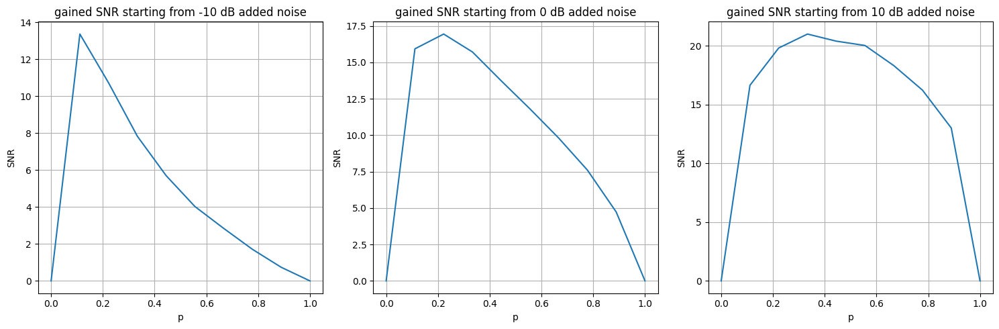

In [62]:
best_p = []
plt.figure(figsize=(15,5))
for i in range(3):
    p = np.linspace(1, 0, 10)
    err = []
    best_lambda = best_lambdas_hard_decrease[i]
    for j in range(len(p)):
        y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],p[j])
        y_soft = hard_iterative(y, omega, best_lambda, 500,decreasing=True)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_p.append(p[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(p, err)
    plt.title('gained SNR starting from ' + str(SNR[i]) + ' dB added noise')
    plt.xlabel('p')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Soft translation invariant (decreasing λ)

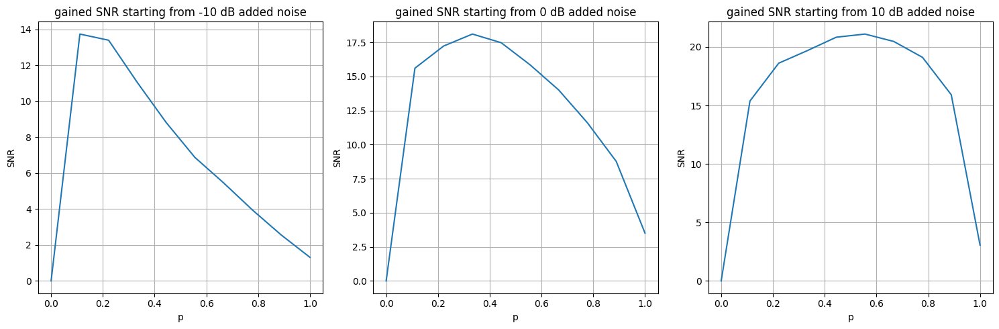

In [63]:
best_p = []
plt.figure(figsize=(15,5))
for i in range(3):
    p = np.linspace(1, 0, 10)
    err = []
    best_lambda = best_lambdas_soft_ti_decrease[i]
    for j in range(len(p)):
        y, y_snr, sig, noiseT, omega  = inpainting(img, SNR[i],p[j])
        y_soft = soft_translation_invariant(y, omega, best_lambda, 500,decreasing=True)
        obtained_snr = snr(img, y_soft)
        snr_gained = obtained_snr - y_snr
        err.append(snr_gained)
    best_p.append(p[np.argmax(err)])
    plt.subplot(1, 3, i+1)
    plt.plot(p, err)
    plt.title('gained SNR starting from ' + str(SNR[i]) + ' dB added noise')
    plt.xlabel('p')
    plt.ylabel('SNR')
    plt.axis('tight')
    plt.grid()
plt.tight_layout()
plt.show()

## Values of p :

    For the 3 methods we observe the same results, the more noise there is and the less pixels (so p is low) we have when we get the best SNR gain

    It is important to be aware of the impact of the noise level on the performance of inpainting using sparse regularization. If the noise level is high, it may be difficult to achieve a significant SNR gain.